<a href="https://colab.research.google.com/github/Aaarin12/Pheno12/blob/main/Lingonberry_shoot_prediction_using_Yolov8s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!nvidia-smi

Mon Feb 24 08:43:40 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install ultralytics

In [4]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/235.7 GB disk)


In [5]:
from ultralytics import YOLO
from IPython.display import display, Image

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EwfHIT9w5sdIPsyyFO5v")
project = rf.workspace("image-analysis-0mduj").project("lingonberry-detection")
version = project.version(6)
dataset = version.download("yolov8")




loading Roboflow workspace...
loading Roboflow project...


In [8]:
dataset.location

'/content/Lingonberry-detection-6'

In [14]:
! yolo task=detect mode=train data={dataset.location}/data.yaml model="yolov8s.pt" epochs=40 imgsz=600

100% 21.5M/21.5M [00:00<00:00, 311MB/s]
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Lingonberry-detection-6/data.yaml, epochs=40, time=None, patience=100, batch=16, imgsz=600, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

In [15]:
from IPython.display import display, Image

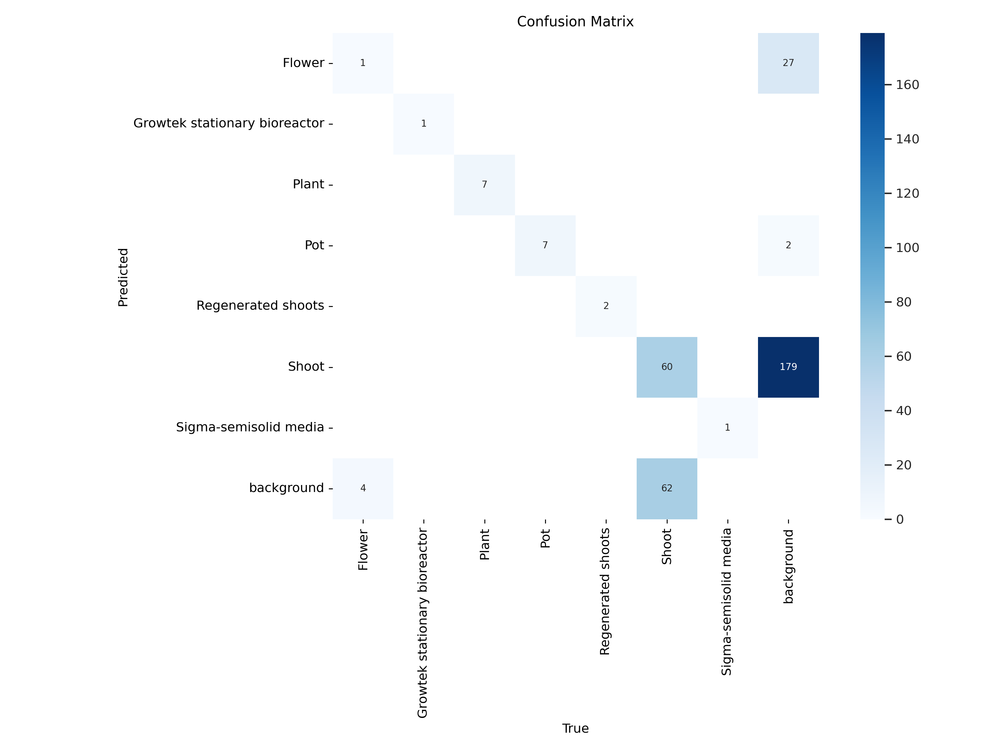

In [16]:
Image ("/content/runs/detect/train2/confusion_matrix.png", width= 900)

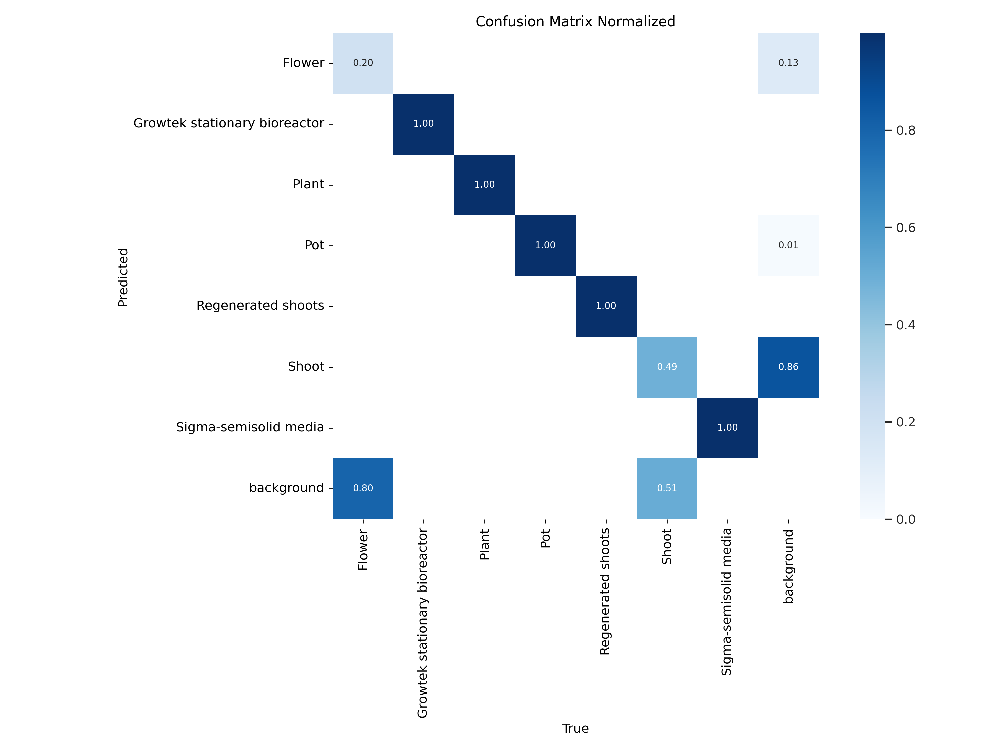

In [17]:
Image ("/content/runs/detect/train2/confusion_matrix_normalized.png", width= 900)

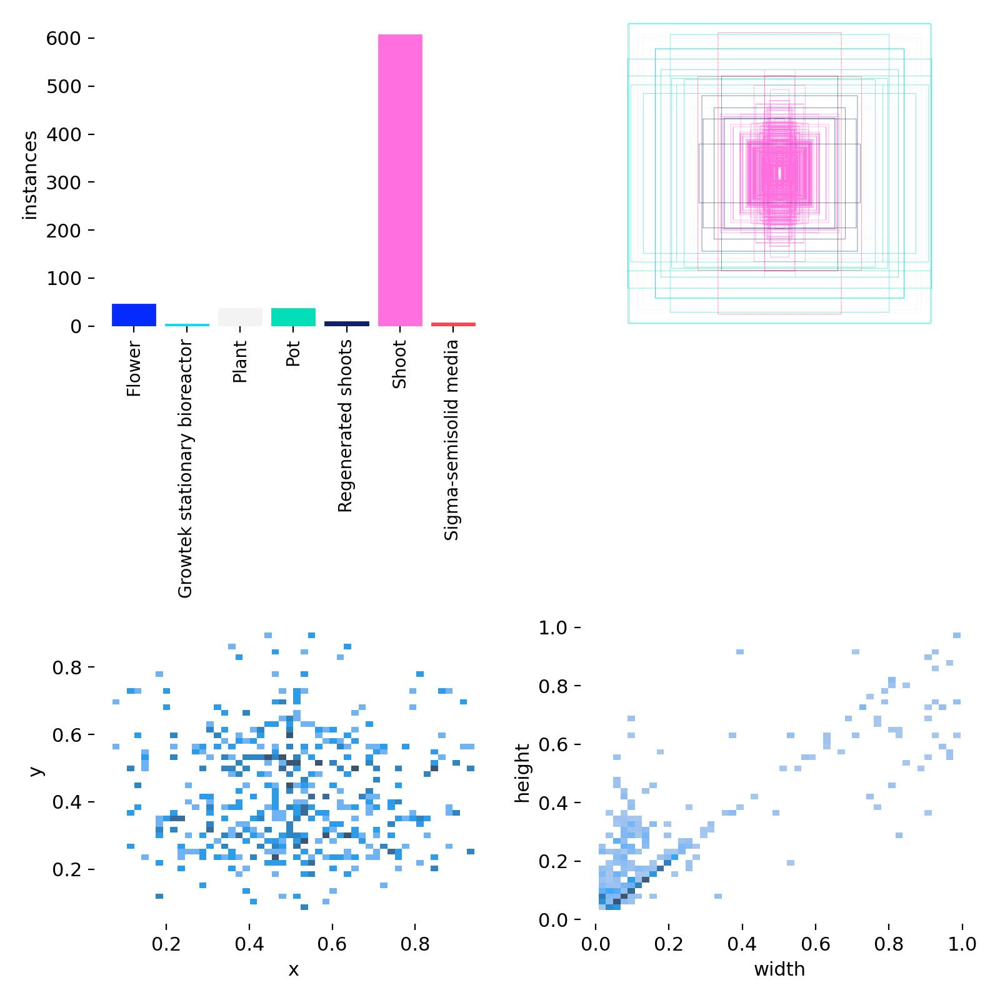

In [19]:
Image ("/content/runs/detect/train2/labels.jpg", width= 900)

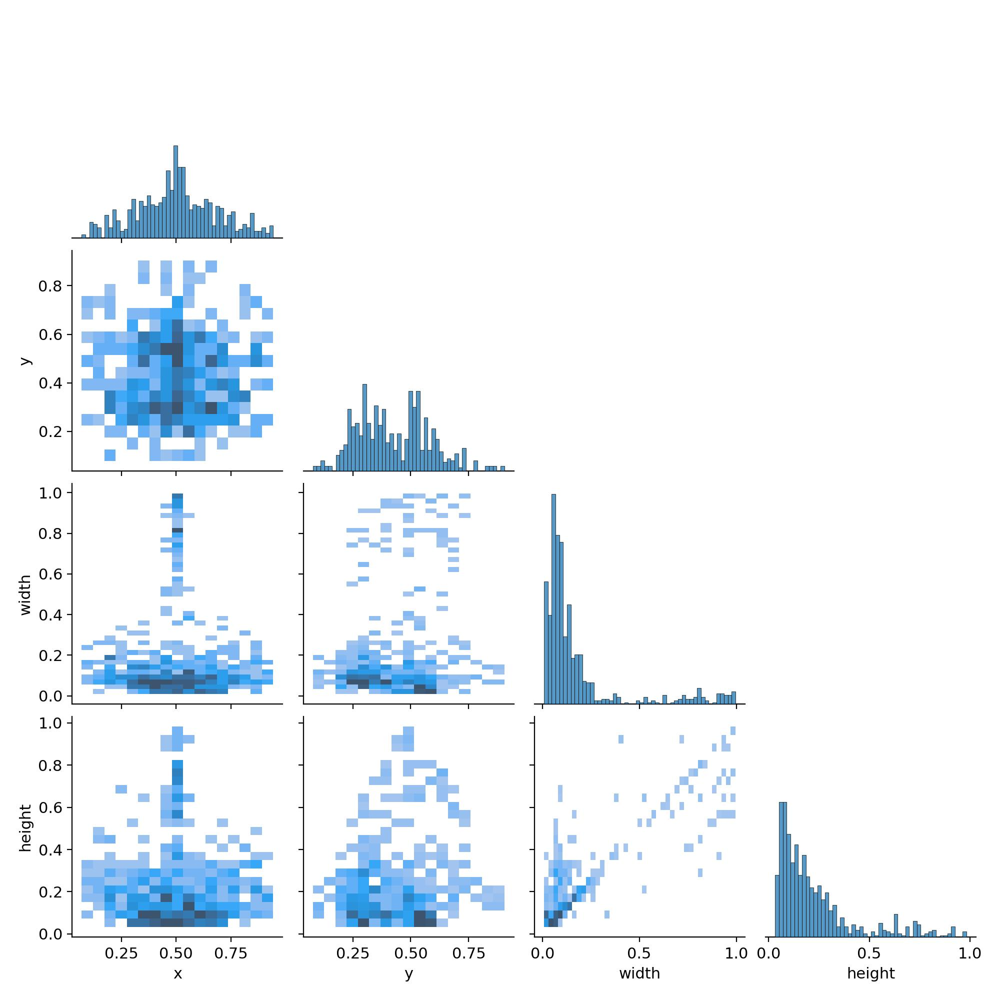

In [20]:
Image ("/content/runs/detect/train2/labels_correlogram.jpg", width= 900)

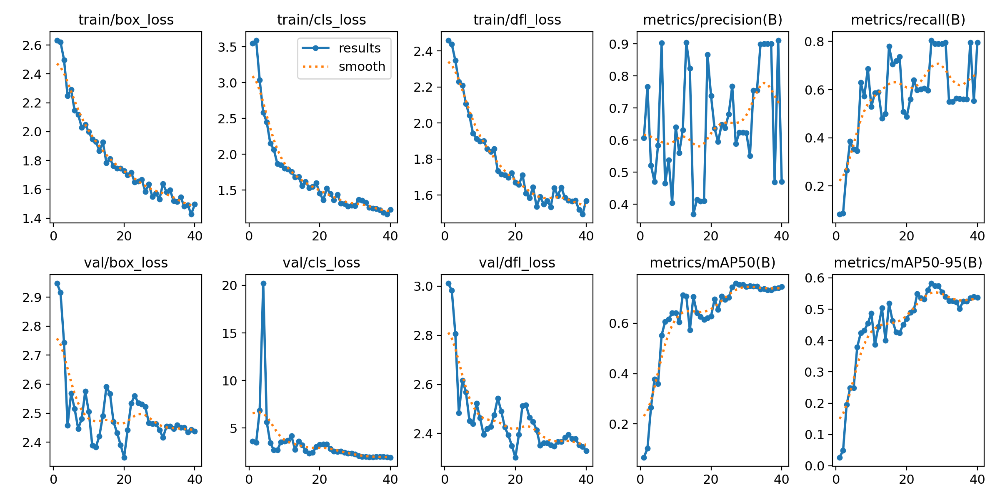

In [21]:
Image ("/content/runs/detect/train2/results.png", width= 900)

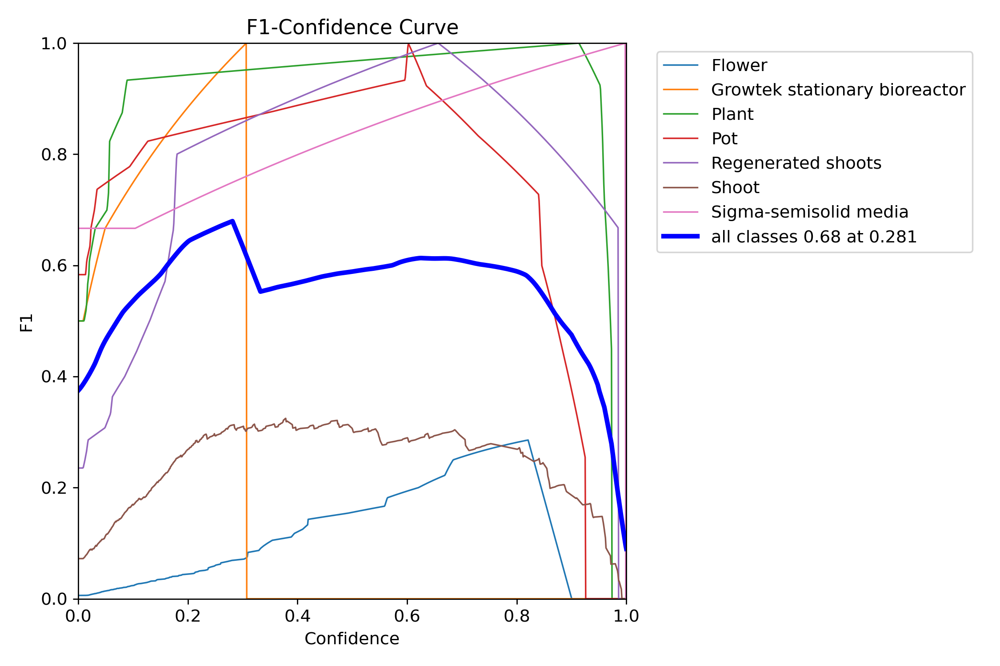

In [22]:
Image ("/content/runs/detect/train2/F1_curve.png", width= 600)

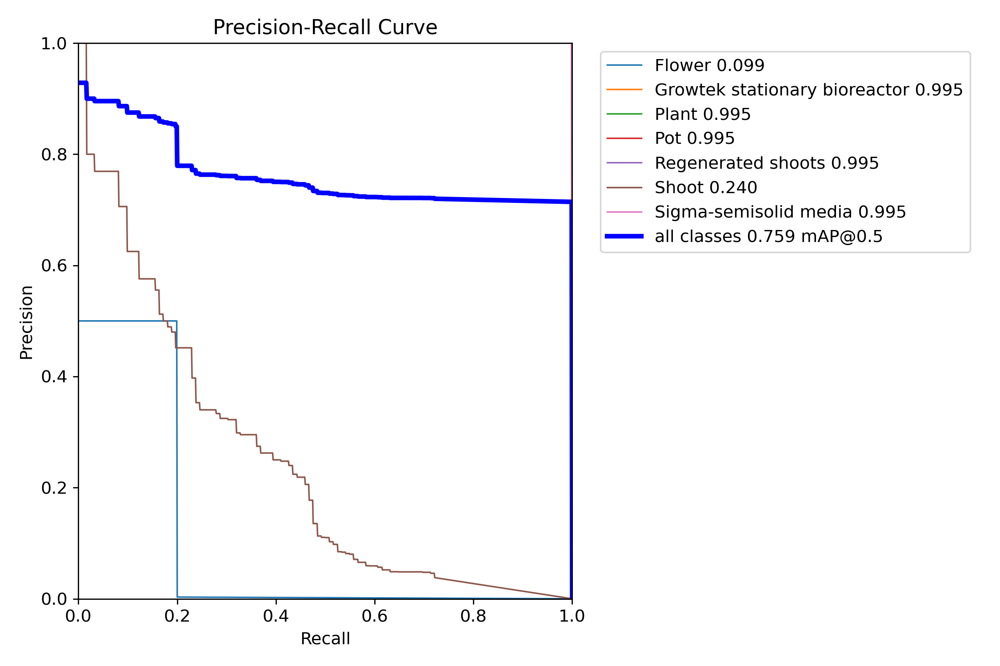

In [23]:
Image ("/content/runs/detect/train2/PR_curve.png", width= 600)

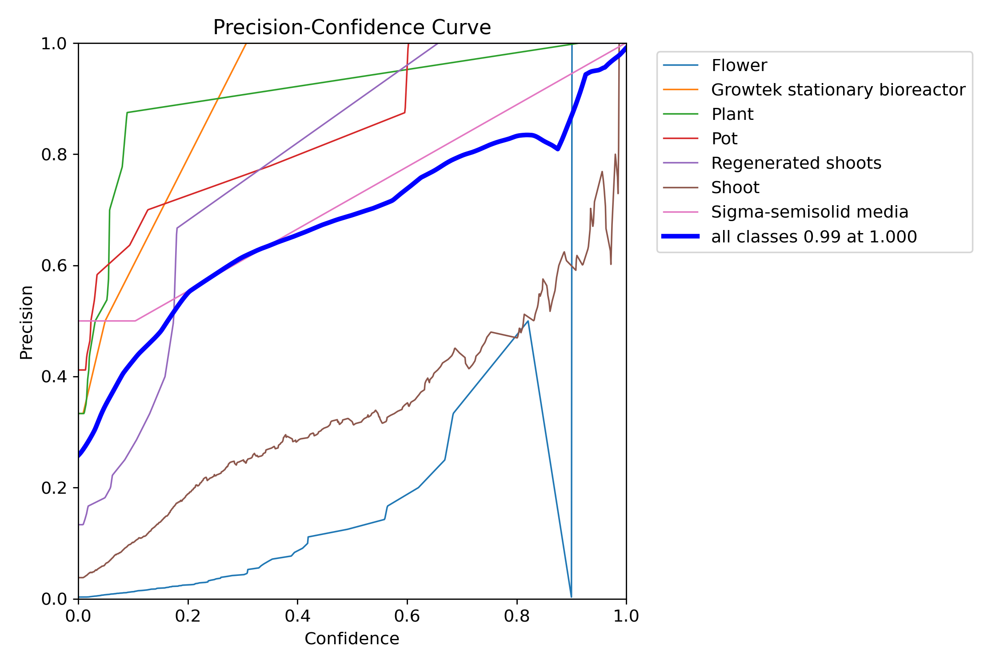

In [24]:
Image ("/content/runs/detect/train2/P_curve.png", width= 600)

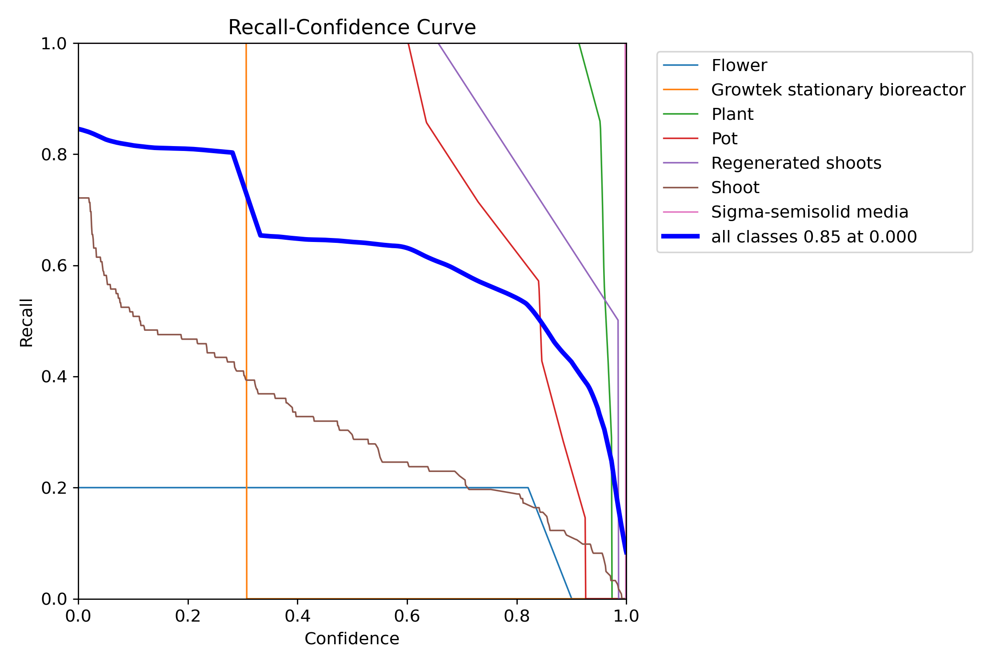

In [25]:
Image ("/content/runs/detect/train2/R_curve.png", width= 600)

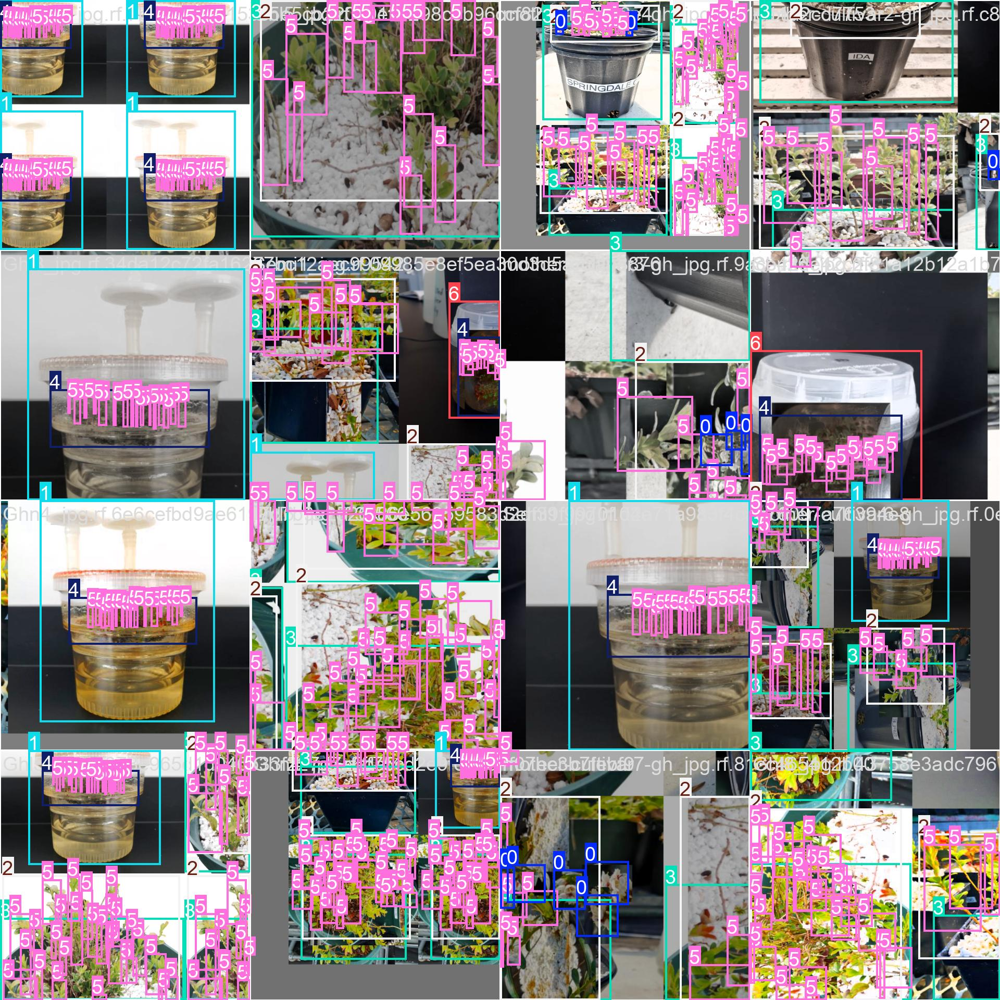

In [26]:
Image ("/content/runs/detect/train2/train_batch0.jpg", width= 900)

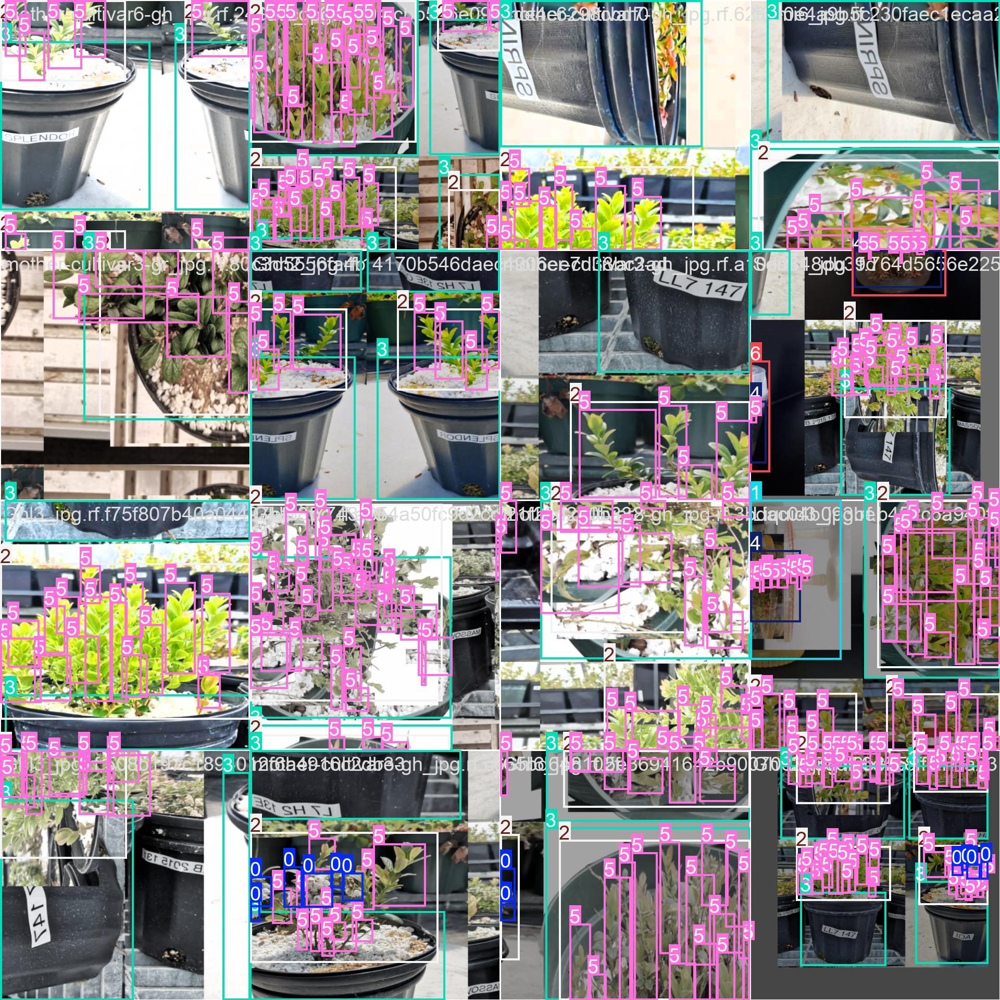

In [27]:
Image ("/content/runs/detect/train2/train_batch1.jpg", width= 900)

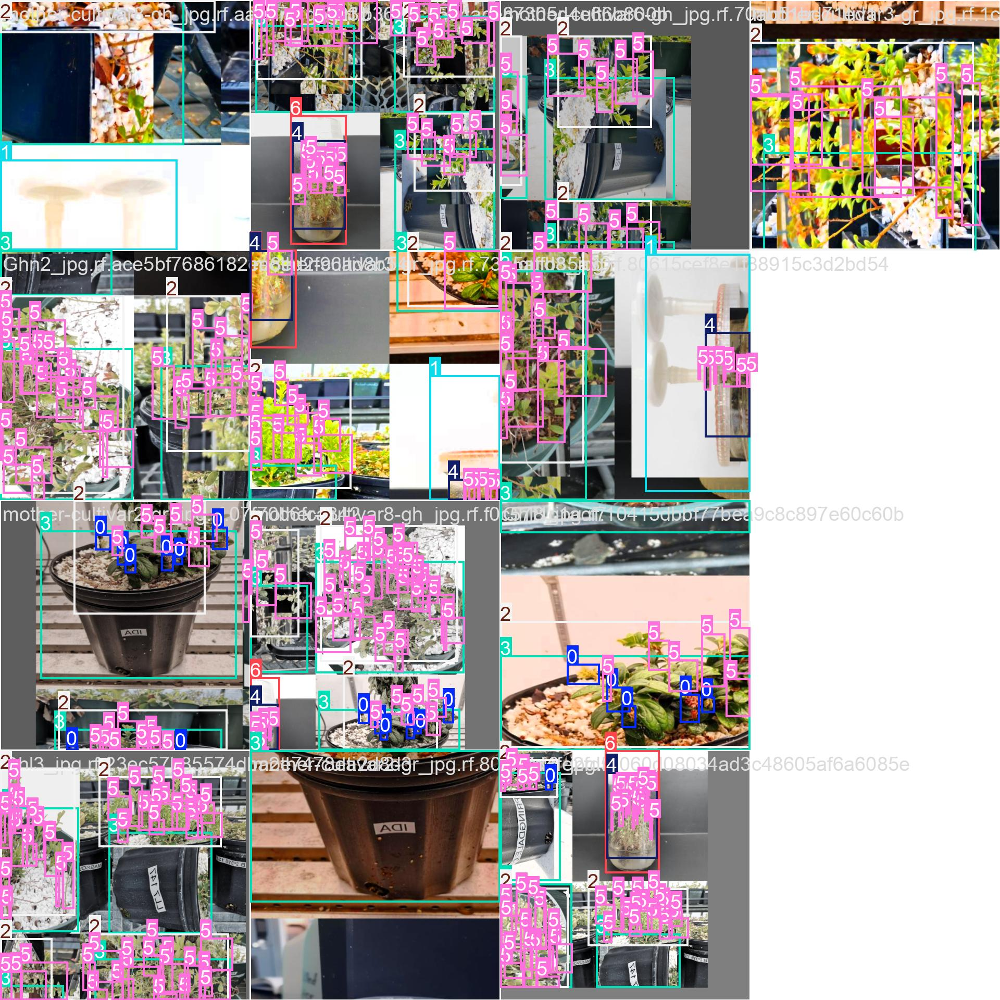

In [29]:
Image ("/content/runs/detect/train2/train_batch2.jpg", width= 900)

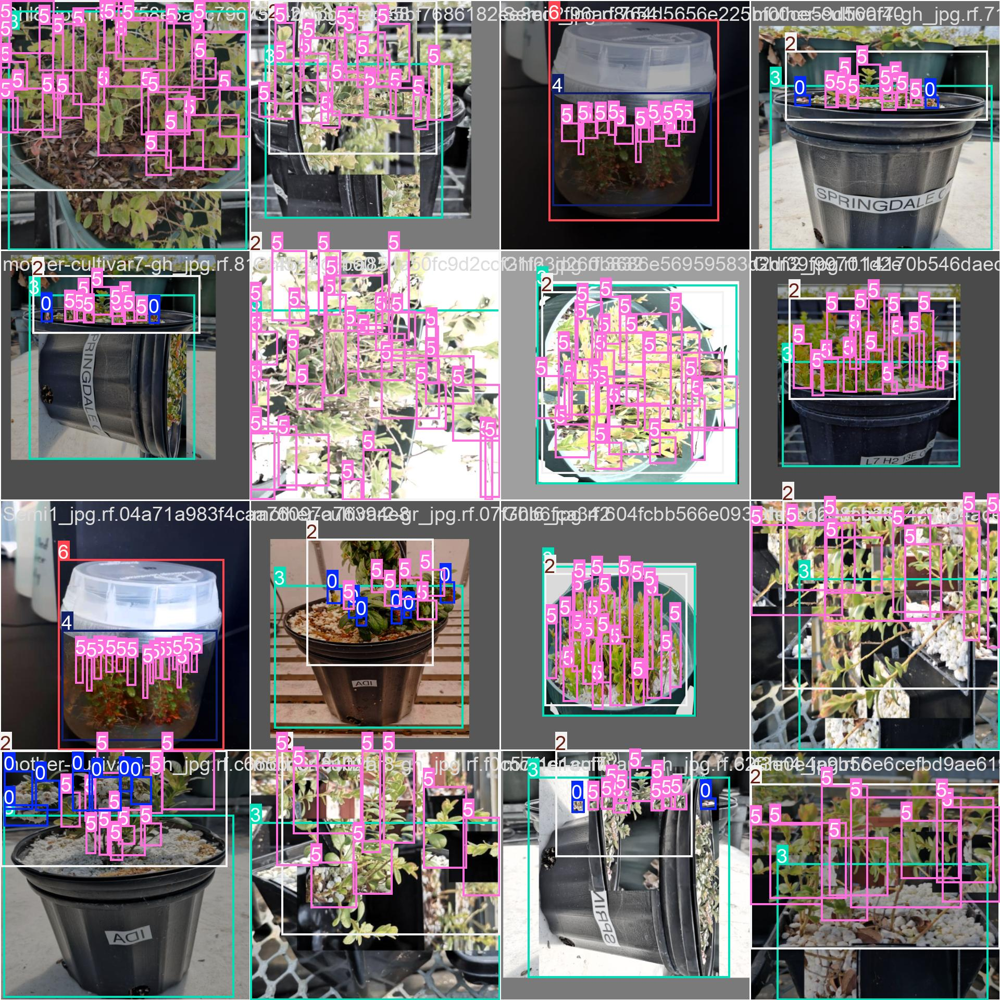

In [30]:
Image ("/content/runs/detect/train2/train_batch90.jpg", width= 900)

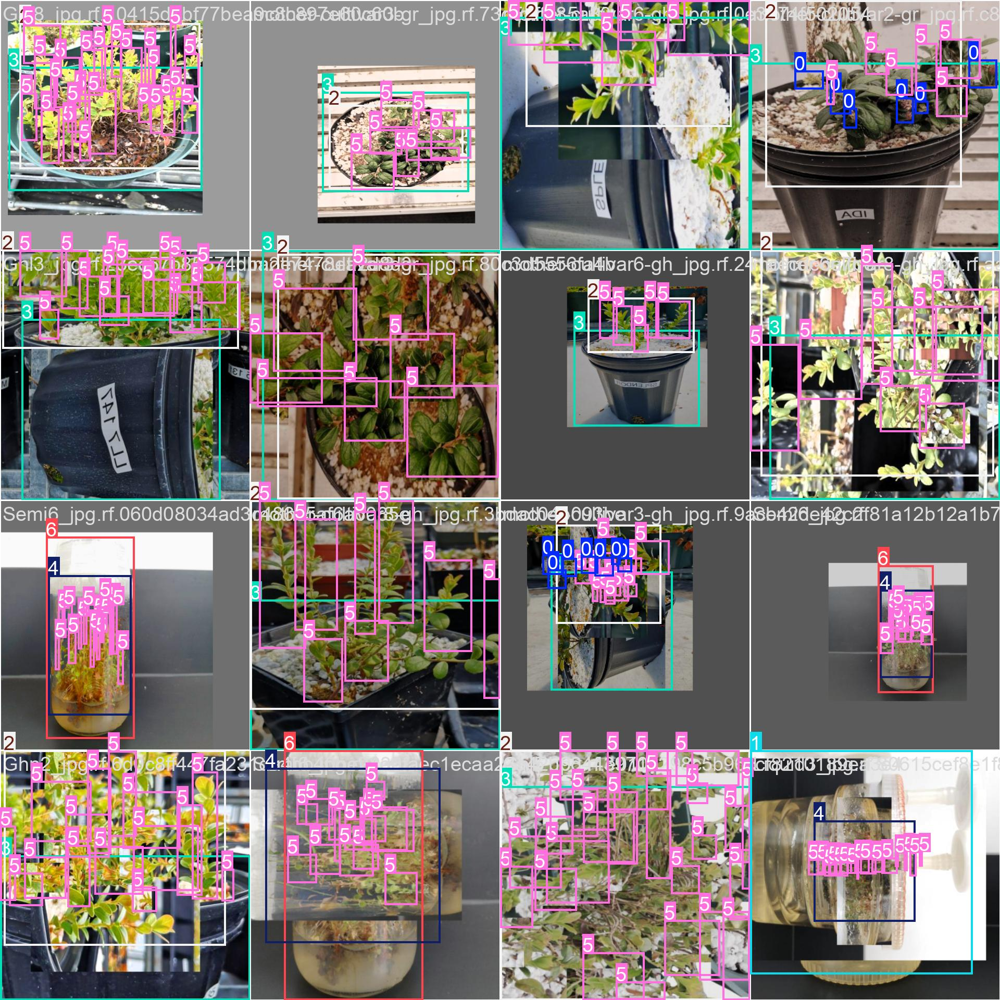

In [31]:
Image ("/content/runs/detect/train2/train_batch91.jpg", width= 900)

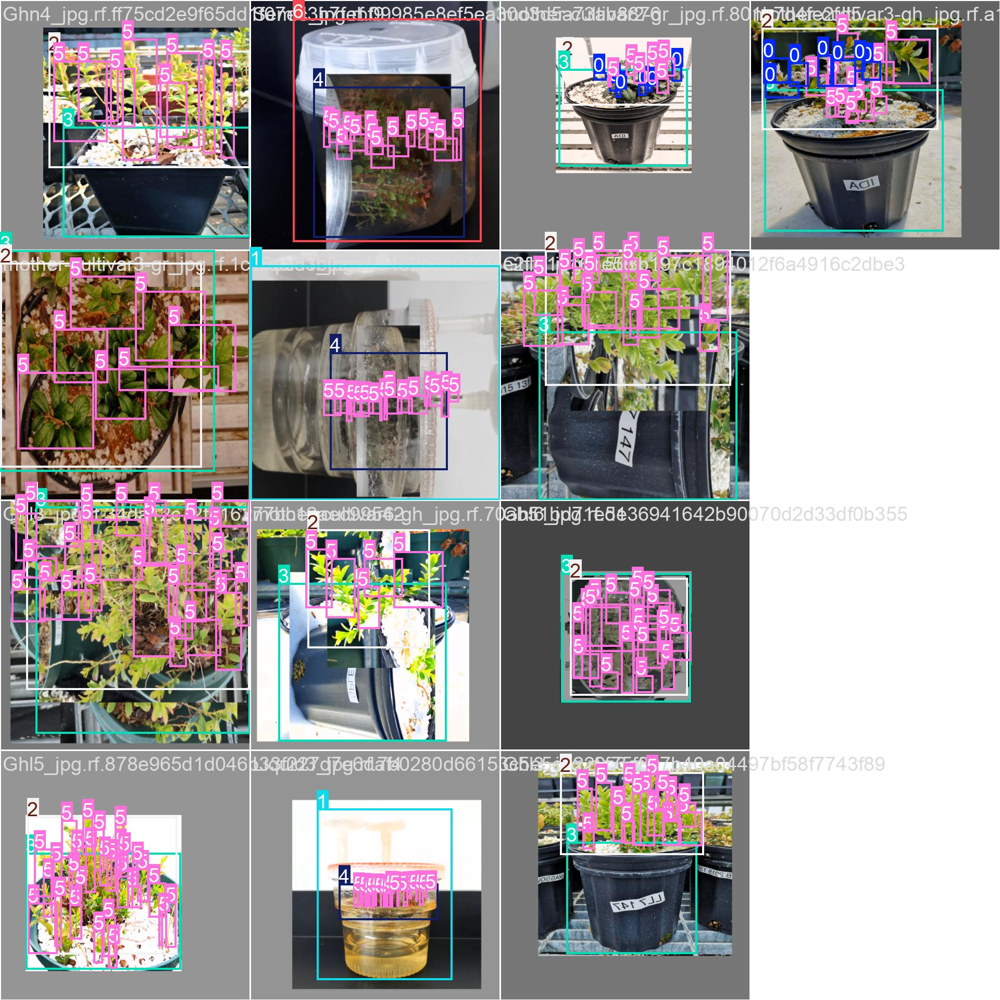

In [32]:
Image ("/content/runs/detect/train2/train_batch92.jpg", width= 900)

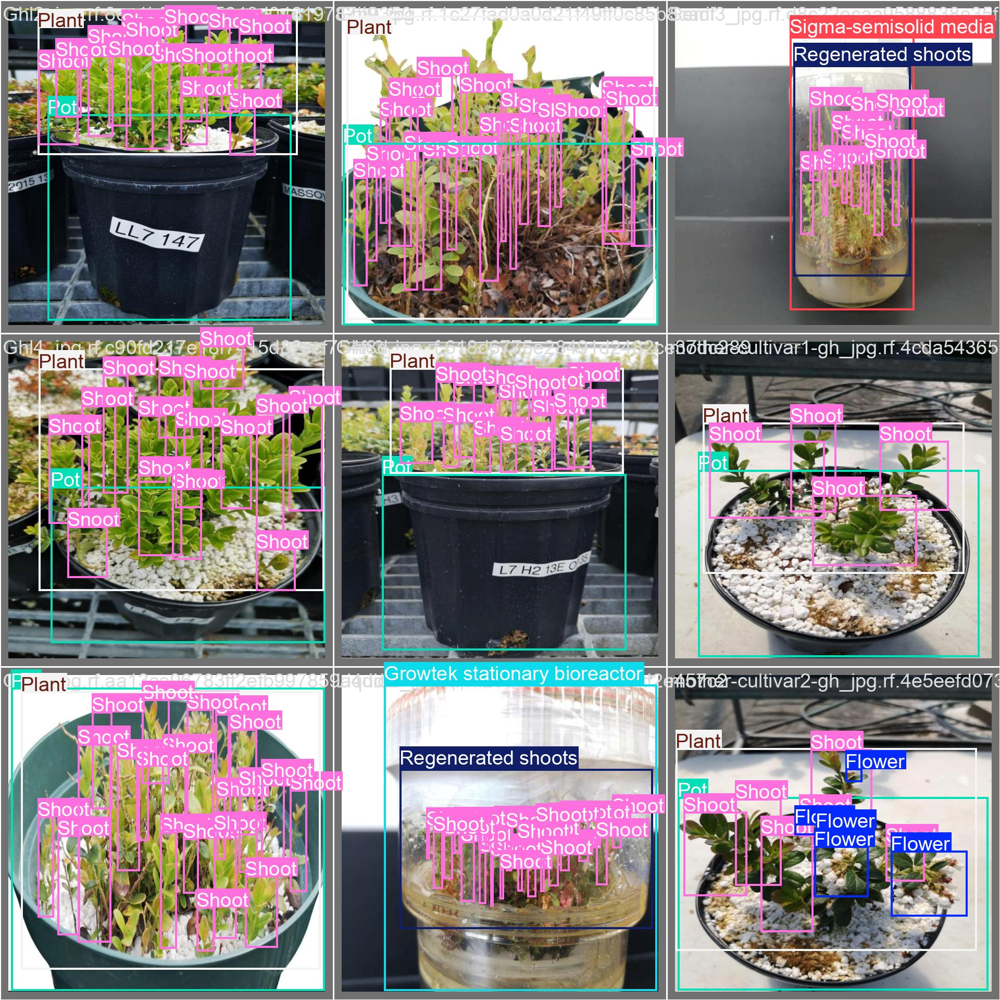

In [33]:
Image ("/content/runs/detect/train2/val_batch0_labels.jpg", width= 900)

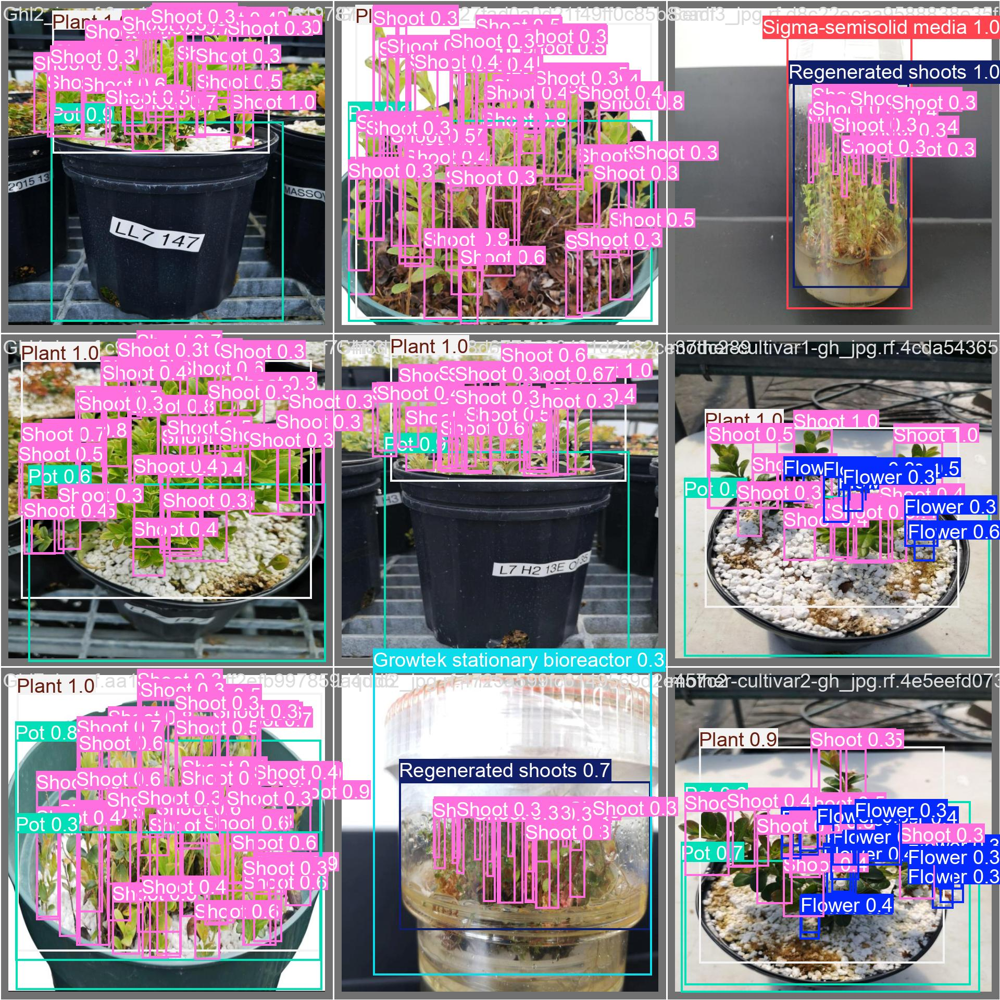

In [34]:
Image ("/content/runs/detect/train2/val_batch0_pred.jpg", width= 900)

In [35]:
! yolo task=detect mode=val model="/content/runs/detect/train2/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/Lingonberry-detection-6/valid/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100% 9/9 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.57it/s]
                   all          9        145       0.59      0.806       0.76      0.583
                Flower          1          5     0.0373        0.2     0.0987     0.0103
Growtek stationary bioreactor          1          1      0.903          1      0.995      0.796
                 Plant          7          7      0.901          1      0.995      0.705
                   Pot          7          7      0.747          1      0.995      0.684
    Regenerated shoots          2          2      0.722          1      0.995      0.822
                 Shoot          9       

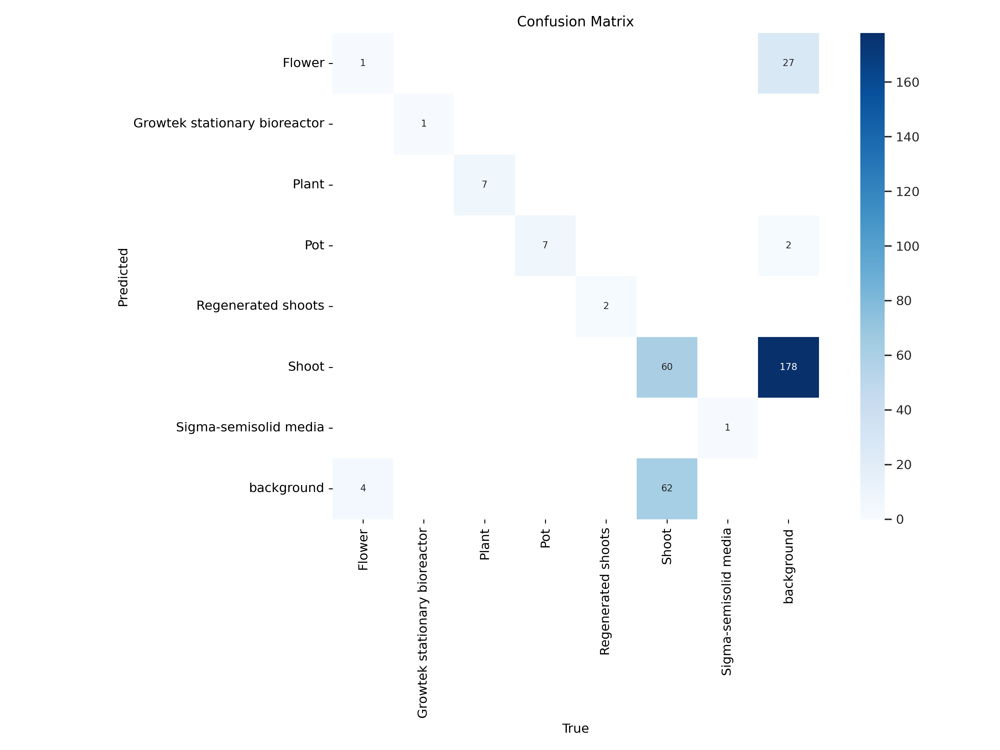

In [36]:
Image ("/content/runs/detect/val/confusion_matrix.png", width= 900)

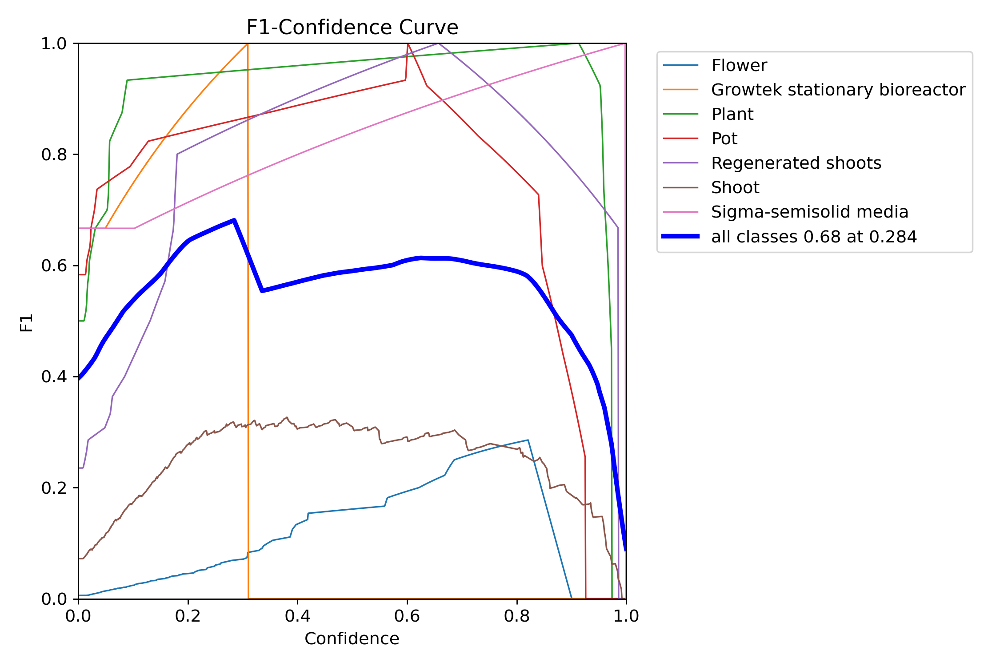

In [37]:
Image ("/content/runs/detect/val/F1_curve.png", width= 600)

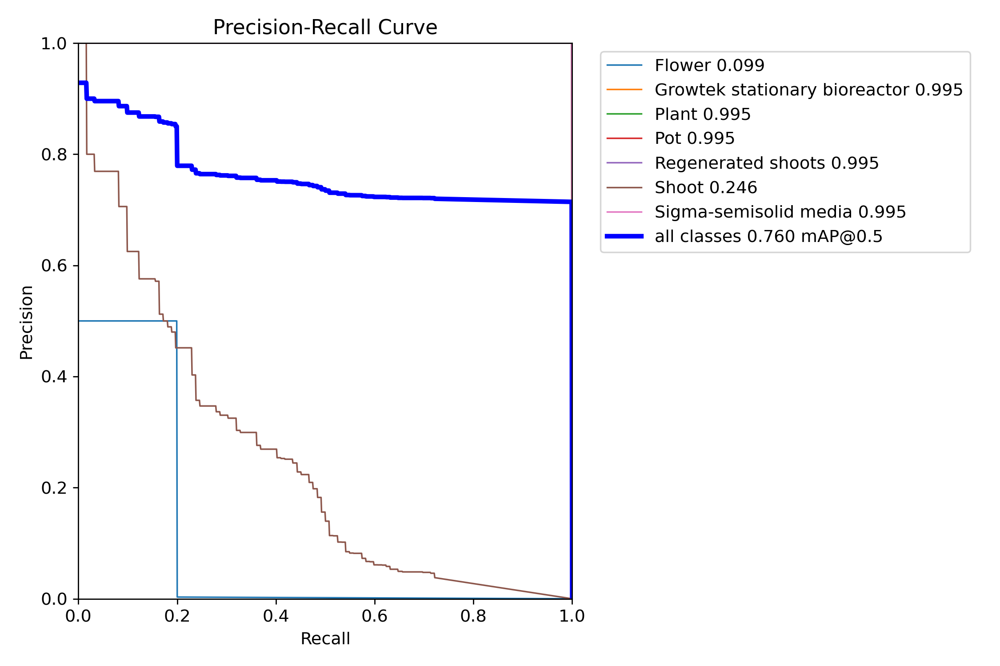

In [38]:
Image ("/content/runs/detect/val/PR_curve.png", width= 600)

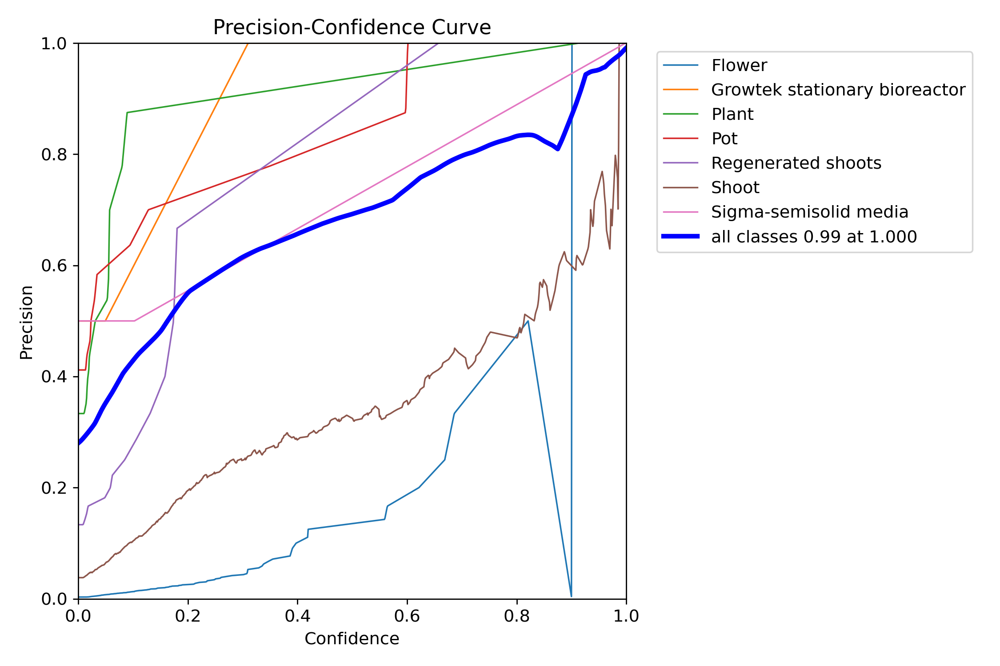

In [39]:
Image ("/content/runs/detect/val/P_curve.png", width= 600)

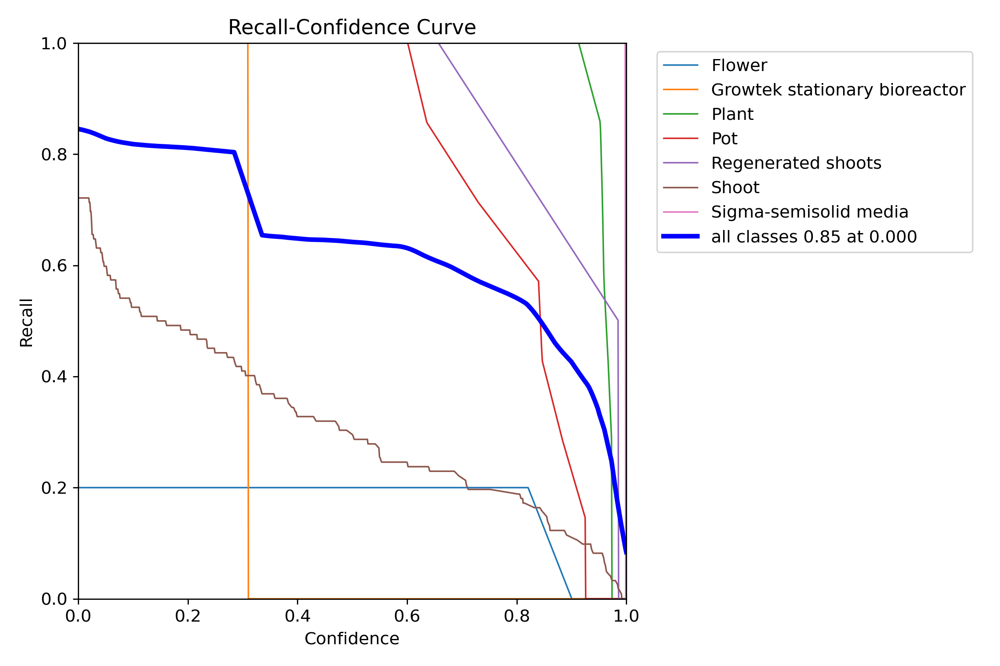

In [40]:
Image ("/content/runs/detect/val/R_curve.png", width= 600)

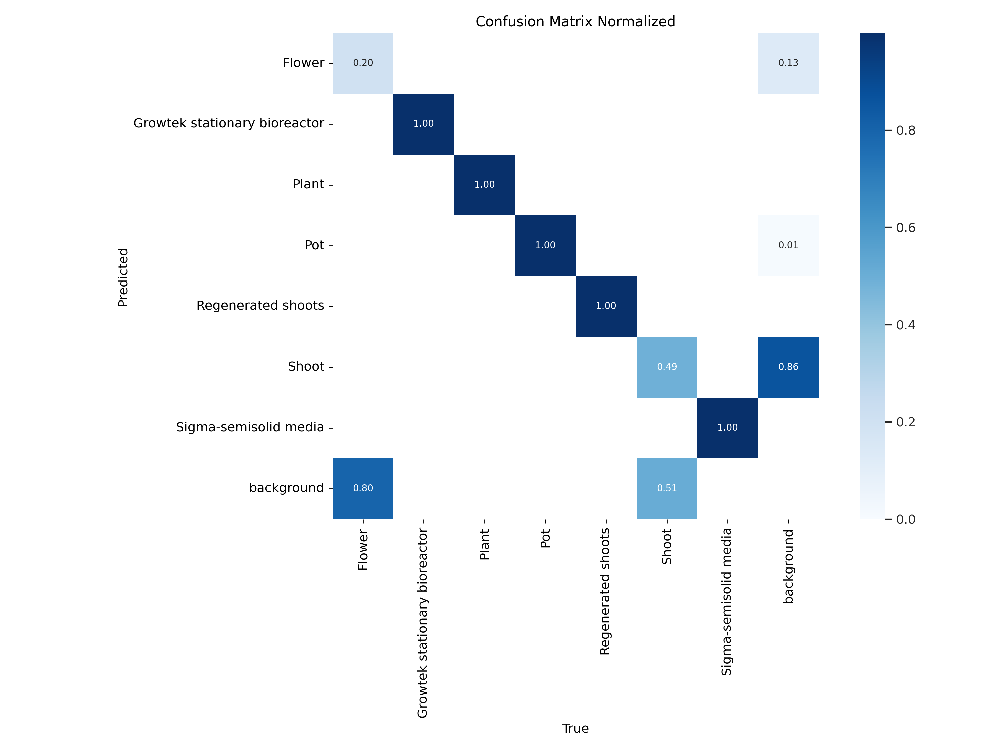

In [41]:
Image ("/content/runs/detect/val/confusion_matrix_normalized.png", width= 900)

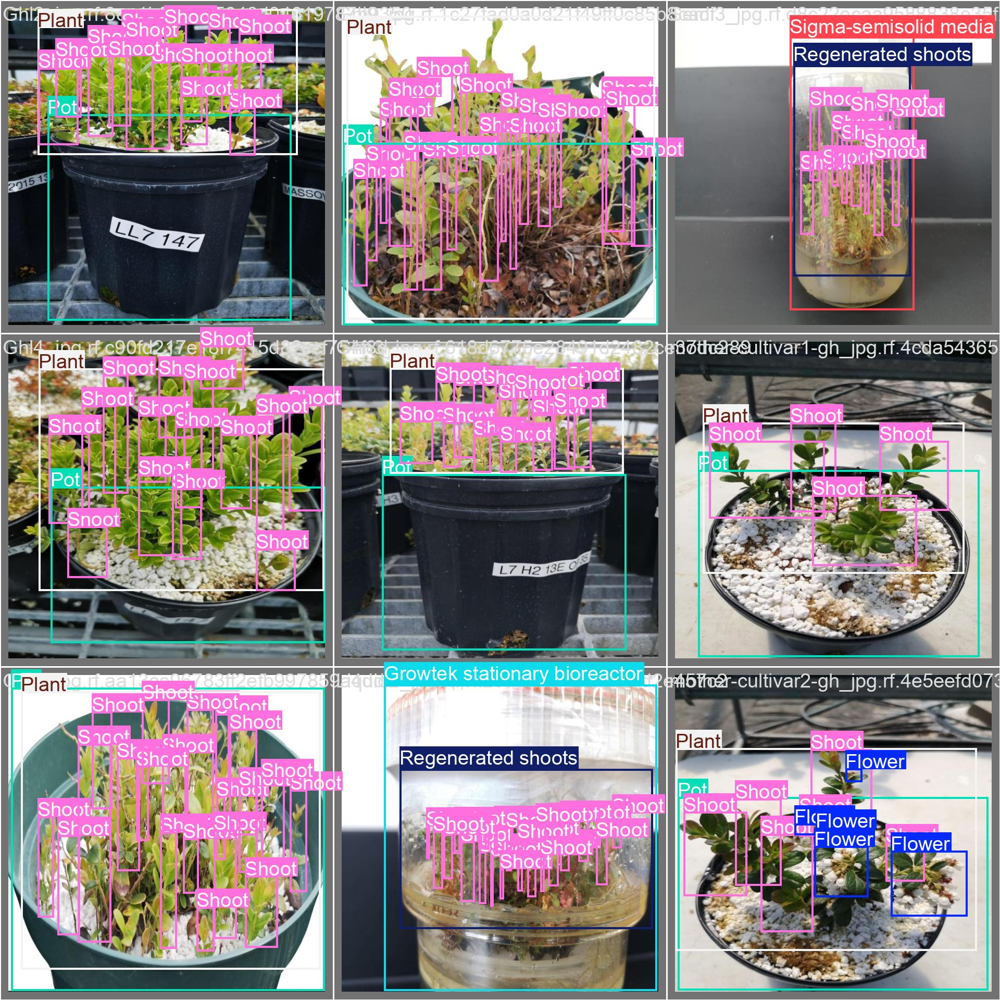

In [42]:
Image ("/content/runs/detect/val/val_batch0_labels.jpg", width= 900)

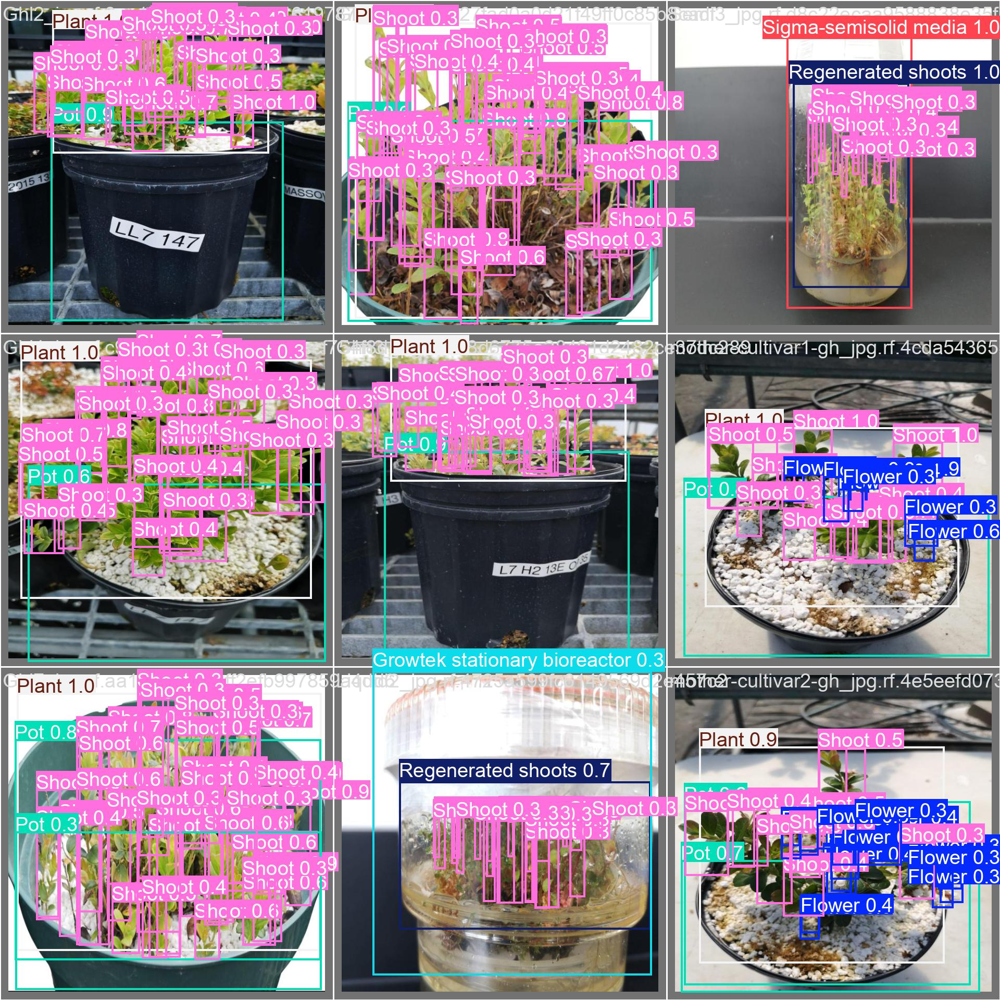

In [43]:
Image ("/content/runs/detect/val/val_batch0_pred.jpg", width= 900)

In [45]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/9 /content/Lingonberry-detection-6/test/images/Ghl10_jpg.rf.81f075790a280103a15dfe6f825ed8aa.jpg: 608x608 1 Plant, 1 Pot, 44 Shoots, 16.2ms
image 2/9 /content/Lingonberry-detection-6/test/images/Ghl1_jpg.rf.6a856fb8fd696ccd3bda5c356b1665a2.jpg: 608x608 1 Plant, 1 Pot, 60 Shoots, 15.9ms
image 3/9 /content/Lingonberry-detection-6/test/images/Ghn1_jpg.rf.49f4ff1cfce48e9cfd7de94d25f0a409.jpg: 608x608 1 Plant, 1 Pot, 31 Shoots, 15.9ms
image 4/9 /content/Lingonberry-detection-6/test/images/Ghn5_jpg.rf.671795f1bd41467799fb4606066d6549.jpg: 608x608 2 Plants, 1 Pot, 37 Shoots, 15.9ms
image 5/9 /content/Lingonberry-detection-6/test/images/Semi2_jpg.rf.866676595eb62f1d2a6b84d98df71566.jpg: 608x608 1 Growtek stationary bioreactor, 1 Regenerated shoots, 15 Shoots, 1 Sigma-semisolid media, 15.9ms
image 6/9 /content/Lingonberry-de

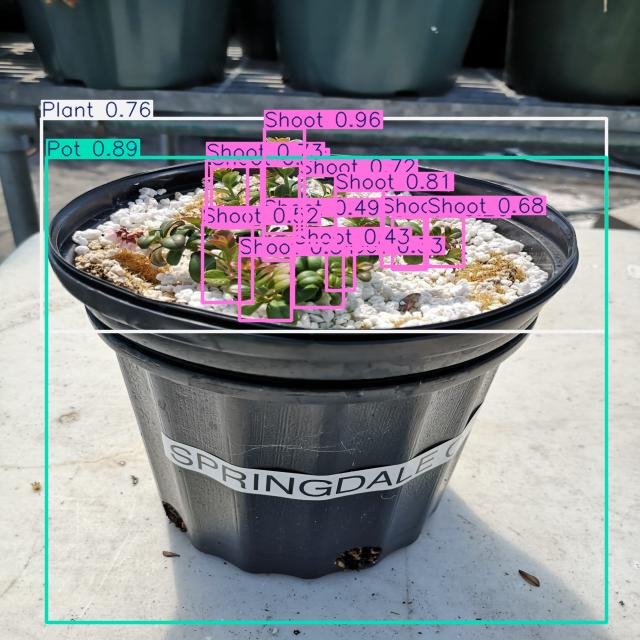

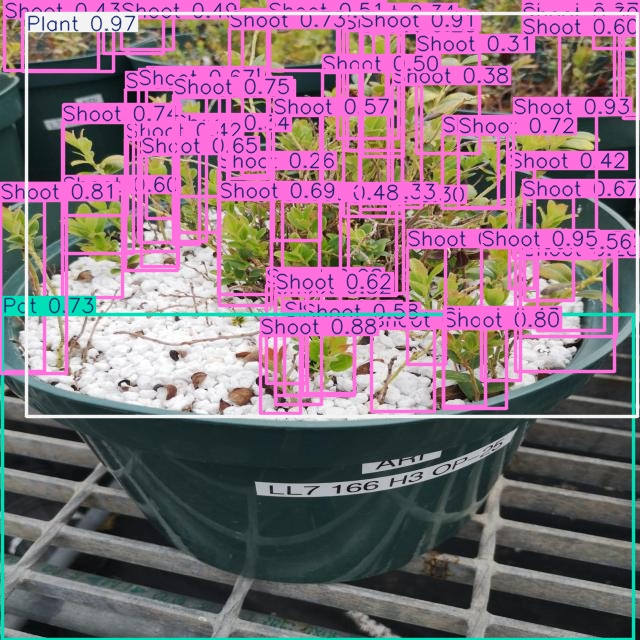

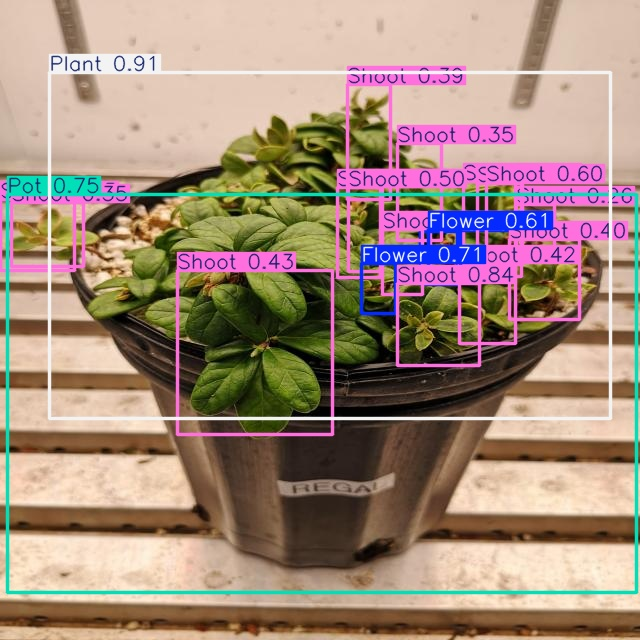

In [46]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
  display(IPyImage(filename=img, width=600))
  print("\n")

In [52]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/cutting-cultivar03-gh.jpg save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /content/drive/MyDrive/cutting-cultivar03-gh.jpg: 608x480 9 Flowers, 1 Plant, 1 Pot, 25 Shoots, 48.6ms
Speed: 3.4ms preprocess, 48.6ms inference, 172.1ms postprocess per image at shape (1, 3, 608, 480)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


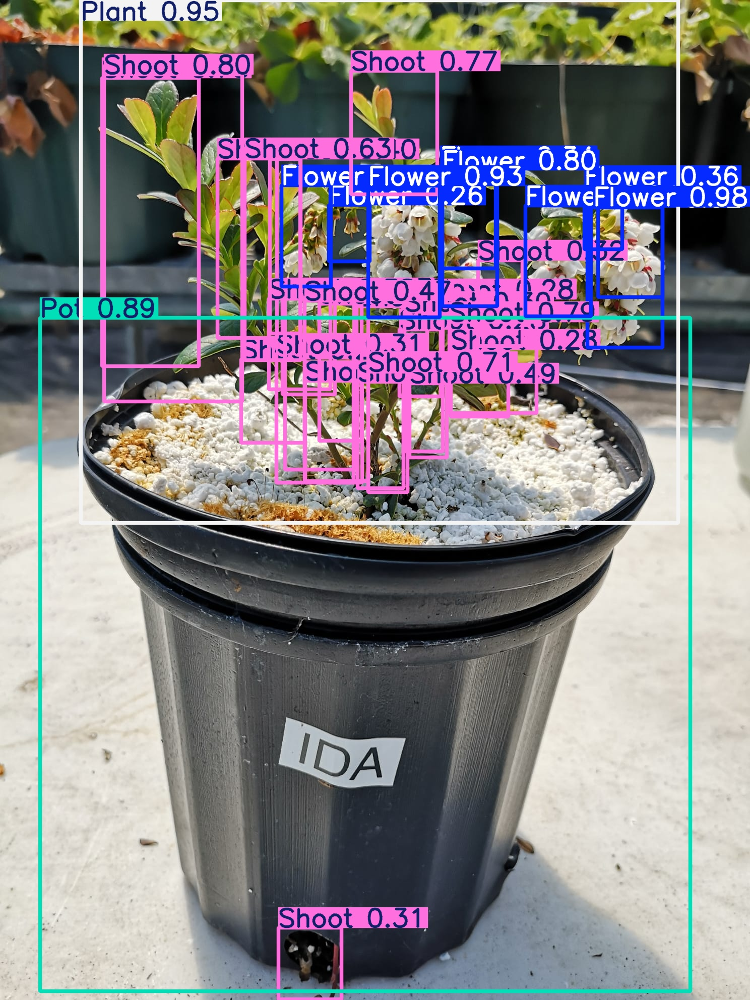

In [53]:
Image ("/content/runs/detect/predict5/cutting-cultivar03-gh.jpg", width= 1200)

In [54]:
!yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/Semi3.jpg save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /content/drive/MyDrive/Semi3.jpg: 480x608 1 Regenerated shoots, 31 Shoots, 1 Sigma-semisolid media, 47.7ms
Speed: 4.4ms preprocess, 47.7ms inference, 158.6ms postprocess per image at shape (1, 3, 480, 608)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


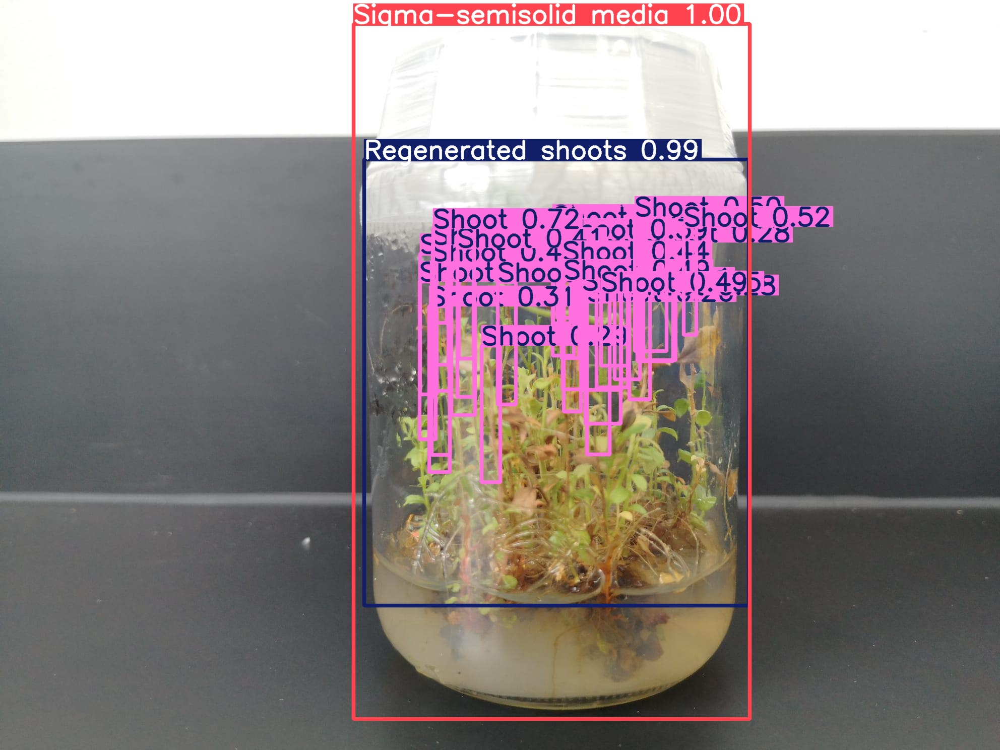

In [55]:
Image ("/content/runs/detect/predict6/Semi3.jpg", width= 1200)

In [62]:
!yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/Liquid3.jpg save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /content/drive/MyDrive/Liquid3.jpg: 608x480 4 Growtek stationary bioreactors, 1 Regenerated shoots, 29 Shoots, 50.5ms
Speed: 4.5ms preprocess, 50.5ms inference, 195.1ms postprocess per image at shape (1, 3, 608, 480)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


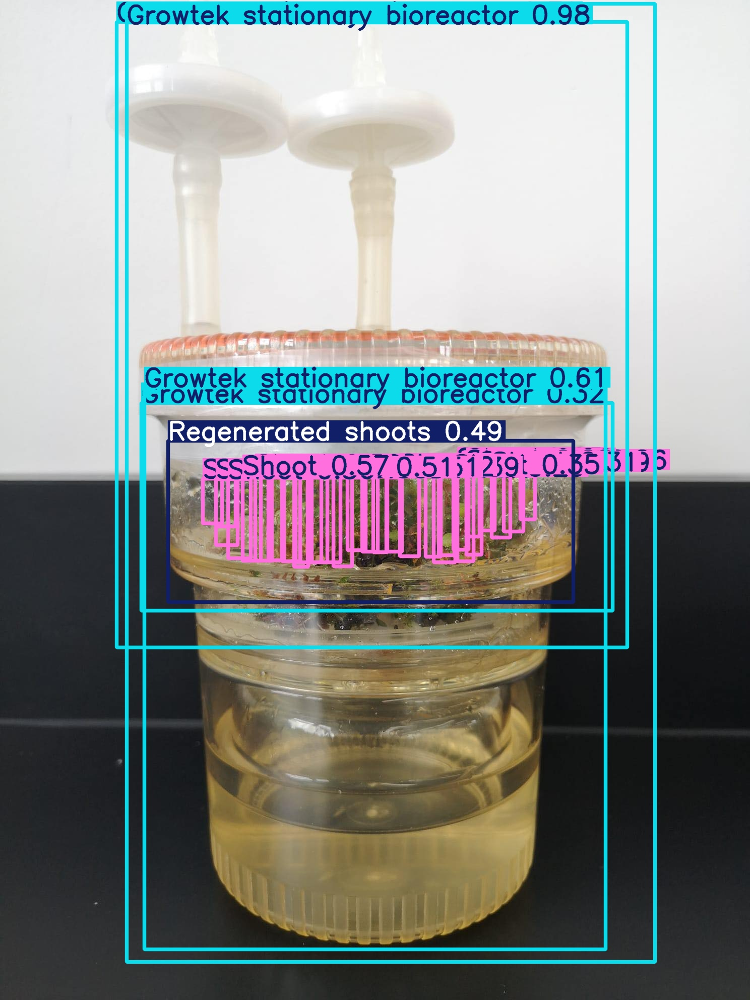

In [63]:
Image ("/content/runs/detect/predict10/Liquid3.jpg", width= 1200)

In [ ]:
# Thank you